# Correlation plots for ov-fiets and weather data

Imports

In [122]:
import pandas as pd
import pyarrow as pa
import matplotlib.pyplot as plt
import seaborn as sns
import json
import plotly.express as px
import numpy as np
import os
import plotly.graph_objects as go
from datetime import datetime
import glob
import pyarrow

## Setup of OV-fiets

In [123]:
## use previously parsed data, now turned into parquet files

# Function to calculate the amount of bikes rented out per day per rental location (multiple for one train station)

def compute_daily_rentals_from_file(file_path):
    """Compute total number of bikes rented out per rental location per day from one parquet file."""
    df = pd.read_parquet(file_path)

    # Ensure correct time order
    df["time"] = pd.to_datetime(df["time"], errors="coerce")
    df = df.sort_values(["description", "time"])

    # Group by station
    results = []
    for station_description, group in df.groupby("description"):
        group = group.sort_values("time")
        group["delta"] = group["extra.rentalBikes"].diff() ##
        # print(group)

        # Only count decreases in bike availability
        group["rentals"] = group["delta"].where(group["delta"] < 0, 0).abs()

        total_rentals = group["rentals"].sum()
        date = group["time"].dt.date.iloc[0]
        station_code = group["stationCode"].unique()
        station_string = np.array2string(station_code)
        # print(type(station_code))

        results.append({
            "description": station_description,
            "date": date,
            "total_rentals": total_rentals,
            "stationCode": station_string
        })

    return pd.DataFrame(results)


In [124]:
## Function to sum the daily rentals for one station (multiple locations)

def compute_total_daily_rentals(df2):
    # Ensure correct time order
    df2["date"] = pd.to_datetime(df2["date"], errors="coerce")
    df2 = df2.sort_values(["stationCode", "date"])

    # Group by station
    results2 = []
    for station, group in df2.groupby("stationCode"):
        group = group.sort_values("date")

        total_rentals_station = group["total_rentals"].sum()

        date = group["date"].dt.date.iloc[0]

        results2.append({
            "station": station,
            "date": date,
            "total_rentals_station": total_rentals_station
        })

    return pd.DataFrame(results2)

In [125]:
# Load the parsed parquet data files and calculate the amount of bikes rented out daily per station
# Save those numbers to a new parquet file

daily_summaries = []
input_folder = "ovfiets_parquet"
output_folder = "ovfiets_daily"
# os.makedirs(output_folder, exist_ok=True)

for file in os.listdir(input_folder):
        path = os.path.join(input_folder, file)
        df_day_intermediate = compute_daily_rentals_from_file(path)
        df_day = compute_total_daily_rentals(df_day_intermediate)
        daily_summaries.append(df_day)


# Combine all daily results into one DataFrame
df_daily = pd.concat(daily_summaries, ignore_index=True)

# Save compact version
output_file = os.path.join(output_folder, 'daily_rentals.parquet')
df_daily.to_parquet(output_file, index=False)
print(f"✅ Saved daily totals to {output_file}")


✅ Saved daily totals to ovfiets_daily\daily_rentals.parquet


In [127]:
df_daily

,station,date,total_rentals_station
0,['ASD'],2023-01-02,1484.0
1,['DT'],2023-01-02,237.0
2,['EHV'],2023-01-02,592.0
3,['ES'],2023-01-02,321.0
4,['GN'],2023-01-02,2428.0
...,...,...,...
1387,['MT'],2023-04-27,450.0
1388,['NM'],2023-04-27,1610.0
1389,['RTD'],2023-04-27,2695.0
1390,['UT'],2023-04-27,6548.0


In [128]:
file = 'ovfiets_parquet/OVFiets_2023-01-21.parquet'

df = pd.read_parquet(file)

# Ensure correct time order
df["time"] = pd.to_datetime(df["time"], errors="coerce")
df = df.sort_values(["description", "time"])

# Group by station
results = []
for station_description, group in df.groupby("description"):
    group = group.sort_values("time")
    group["delta"] = group["extra.rentalBikes"].diff() ##
    # print(group)

    # Only count decreases in bike availability
    group["rentals"] = group["delta"].where(group["delta"] < 0, 0).abs()

    total_rentals = group["rentals"].sum()
    date = group["time"].dt.date.iloc[0]
    station_code = group["stationCode"].unique()
    station_string = np.array2string(station_code)
    print(type(station_code))

    results.append({
        "description": station_description,
        "date": date,
        "total_rentals": total_rentals,
        "stationCode": station_string
    })


<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


In [129]:
print(results)

[{'description': 'Amsterdam Centraal IJzijde', 'date': datetime.date(2023, 1, 21), 'total_rentals': np.float64(759.0), 'stationCode': "['ASD']"}, {'description': 'Amsterdam Centraal Oost', 'date': datetime.date(2023, 1, 21), 'total_rentals': np.float64(171.0), 'stationCode': "['ASD']"}, {'description': 'Amsterdam Centraal West', 'date': datetime.date(2023, 1, 21), 'total_rentals': np.float64(3659.0), 'stationCode': "['ASD']"}, {'description': 'Delft, Fietsenstalling', 'date': datetime.date(2023, 1, 21), 'total_rentals': np.float64(938.0), 'stationCode': "['DT']"}, {'description': 'Den Haag Centraal Koningin Julianaplein', 'date': datetime.date(2023, 1, 21), 'total_rentals': np.float64(1484.0), 'stationCode': "['GVC']"}, {'description': 'Den Haag Centraal Stichthage', 'date': datetime.date(2023, 1, 21), 'total_rentals': np.float64(2318.0), 'stationCode': "['GVC']"}, {'description': 'Eindhoven Noordzijde', 'date': datetime.date(2023, 1, 21), 'total_rentals': np.float64(224.0), 'stationCo

In [130]:
df.head()

,time,city,lat,stationCode,lng,description,extra.rentalBikes
18,2023-01-21 03:00:09+00:00,Amsterdam,52.380095,ASD,4.898784,Amsterdam Centraal IJzijde,40.0
39,2023-01-21 03:01:05+00:00,Amsterdam,52.380095,ASD,4.898784,Amsterdam Centraal IJzijde,40.0
60,2023-01-21 03:02:00+00:00,Amsterdam,52.380095,ASD,4.898784,Amsterdam Centraal IJzijde,40.0
81,2023-01-21 03:02:55+00:00,Amsterdam,52.380095,ASD,4.898784,Amsterdam Centraal IJzijde,40.0
102,2023-01-21 03:03:51+00:00,Amsterdam,52.380095,ASD,4.898784,Amsterdam Centraal IJzijde,40.0


In [131]:
df2 = pd.DataFrame(results)
# print(df2)

# Ensure correct time order
df2["date"] = pd.to_datetime(df2["date"], errors="coerce")
df2 = df2.sort_values(["stationCode", "date"])

# Group by station
results2 = []
for station, group in df2.groupby("stationCode"):
    group = group.sort_values("date")

    total_rentals_station = group["total_rentals"].sum()

    date = group["date"].dt.date.iloc[0]

    results2.append({
        "station": station,
        "date": date,
        "total_rentals_station": total_rentals_station
    })

df3 = pd.DataFrame(results2)
    


In [132]:
print(df3['station'])

0     ['ASD']
1      ['DT']
2     ['EHV']
3      ['ES']
4      ['GN']
5     ['GVC']
6     ['MDB']
7      ['MT']
8      ['NM']
9     ['RTD']
10     ['UT']
11     ['ZL']
Name: station, dtype: object


## Calculating weekly average OV-fiets rental number

In [133]:
# Open the parquet file containing the daily rental numbers

df_daily = pd.read_parquet("ovfiets_daily/daily_rentals.parquet")
df_daily["date"] = pd.to_datetime(df_daily["date"])

# Calculate the weekly average rental numbers

weekly_avg_ov_fiets = (
    df_daily
    .set_index("date")
    .groupby("station")
    ["total_rentals_station"]
    .resample("W")
    .mean()
    .reset_index()
)

print(weekly_avg_ov_fiets)


     station       date  total_rentals_station
0    ['ASD'] 2023-01-08            2474.285714
1    ['ASD'] 2023-01-15            3182.857143
2    ['ASD'] 2023-01-22            3537.571429
3    ['ASD'] 2023-01-29            3628.428571
4    ['ASD'] 2023-02-05            1316.428571
..       ...        ...                    ...
199   ['ZL'] 2023-04-02             902.428571
200   ['ZL'] 2023-04-09             971.571429
201   ['ZL'] 2023-04-16            1074.571429
202   ['ZL'] 2023-04-23            1125.285714
203   ['ZL'] 2023-04-30            1195.500000

[204 rows x 3 columns]


## Setup of KNMI data

In [134]:
## READ IN KNMI DATA

#Daily file
# TG: Etmaalgemiddelde temperatuur (in 0.1 graden Celsius)
# TX: Maximum temperatuur (in 0.1 graden Celsius)
# RH: Etmaalsom van de neerslag (in 0.1 mm) (-1 voor <0.05 mm)

knmi_file = 'knmi_data/knmi_daily_20230102_20231231.txt'

knmi_data = pd.read_csv(knmi_file,  sep=",",          # tab-separated values
    engine="python",   # more tolerant of inconsistent line lengths
    header=60,          # or None if there’s no header
    na_values=["", "NA", "NaN"],  # handle missing entries
    on_bad_lines="skip"  # skip malformed rows (or use 'warn')
)

print(knmi_data.head())

knmi_data.rename(columns={"# STN": "station_code"}, inplace=True)
knmi_data.columns = knmi_data.columns.str.strip()
knmi_data["date"] = pd.to_datetime(knmi_data["YYYYMMDD"], format="%Y%m%d")
knmi_data = knmi_data.set_index("date")

knmi_data = knmi_data.apply(pd.to_numeric, errors='coerce')



print(knmi_data.head())

   # STN  YYYYMMDD     TG     TX     RH
0    209  20230102                     
1    209  20230103                     
2    209  20230104                     
3    209  20230105                     
4    209  20230106                     
            station_code  YYYYMMDD  TG  TX  RH
date                                          
2023-01-02           209  20230102 NaN NaN NaN
2023-01-03           209  20230103 NaN NaN NaN
2023-01-04           209  20230104 NaN NaN NaN
2023-01-05           209  20230105 NaN NaN NaN
2023-01-06           209  20230106 NaN NaN NaN


## Calculating weekly average temperature 


In [135]:
# Pick one weather station
station = 344
station_name = 'Delft'

knmi_onestation = knmi_data[knmi_data['station_code'] == station]

# print(knmi_onestation)

In [136]:
## calculate weekly average

weekly_avg_knmi = knmi_data["TX"].resample("W").mean()

print(weekly_avg_knmi)


date
2023-01-08    110.302521
2023-01-15     99.529412
2023-01-22     39.613445
2023-01-29     46.184874
2023-02-05     88.222689
2023-02-12     74.113445
2023-02-19    110.735294
2023-02-26     83.928571
2023-03-05     73.155462
2023-03-12     61.168067
2023-03-19    130.352941
2023-03-26    119.731092
2023-04-02    111.806723
2023-04-09    111.995798
2023-04-16    129.575630
2023-04-23    148.995798
2023-04-30    127.483193
2023-05-07    174.689076
2023-05-14    181.357143
2023-05-21    167.852941
2023-05-28    185.521008
2023-06-04    190.285714
2023-06-11    246.340336
2023-06-18    265.546218
2023-06-25    263.907563
2023-07-02    219.042017
2023-07-09    243.390756
2023-07-16    241.365546
2023-07-23    214.865546
2023-07-30    210.054622
2023-08-06    199.432773
2023-08-13    220.134454
2023-08-20    243.126050
2023-08-27    228.882353
2023-09-03    204.785714
2023-09-10    285.878151
2023-09-17    226.966387
2023-09-24    196.991597
2023-10-01    211.978992
2023-10-08    196.17

Text(0, 0.5, 'Temperature in 0.1 degrees celsius')

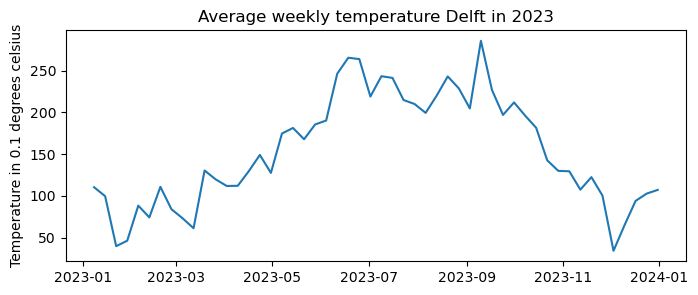

In [137]:
# Quick plot of weekly average

plt.figure(figsize=(8,3))
plt.plot(weekly_avg_knmi)
plt.title('Average weekly temperature Delft in 2023')
plt.ylabel('Temperature in 0.1 degrees celsius')

## Correlation plot delft station  2023

In [144]:
weekly_avg_ov_fiets[weekly_avg_ov_fiets['station'] == "['DT']"]

,station,date,total_rentals_station
17,['DT'],2023-01-08,456.000000
18,['DT'],2023-01-15,1167.000000
19,['DT'],2023-01-22,1133.571429
20,['DT'],2023-01-29,776.571429
21,['DT'],2023-02-05,864.428571
22,['DT'],2023-02-12,1037.428571
23,['DT'],2023-02-19,1372.571429
24,['DT'],2023-02-26,1509.714286
25,['DT'],2023-03-05,1014.714286
26,['DT'],2023-03-12,1094.714286


Text(0.5, 1.0, 'Correlationplot')

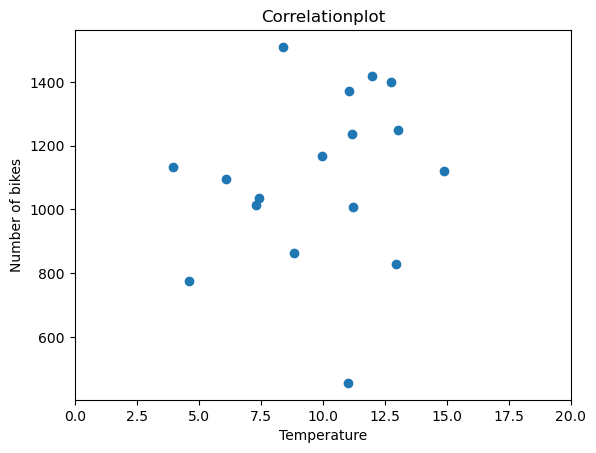

In [143]:



weekly_avg_ov_fiets_delft = weekly_avg_ov_fiets[weekly_avg_ov_fiets['station'] == "['DT']"]

x = weekly_avg_knmi[0:17] / 10
y = weekly_avg_ov_fiets_delft["total_rentals_station"]


plt.figure()
plt.scatter(x,y)
plt.ylabel('Number of bikes')
plt.xlabel('Temperature')
plt.xlim(0,20)
# plt.ylim(0,350)
plt.title('Correlationplot')


In [110]:
weekly_avg_ov_fiets["total_rentals_station"].loc[0:3]

0    2473.571429
1    3182.714286
2    3536.714286
3    3564.250000
Name: total_rentals_station, dtype: float64

In [117]:
weekly_avg_ov_fiets[weekly_avg_ov_fiets['station'] == "['DT']"]

,station,date,total_rentals_station
4,['DT'],2023-01-08,173.714286
5,['DT'],2023-01-15,274.000000
6,['DT'],2023-01-22,282.000000
7,['DT'],2023-01-29,334.000000


In [115]:
weekly_avg_ov_fiets

,station,date,total_rentals_station
0,['ASD'],2023-01-08,2473.571429
1,['ASD'],2023-01-15,3182.714286
2,['ASD'],2023-01-22,3536.714286
3,['ASD'],2023-01-29,3564.250000
4,['DT'],2023-01-08,173.714286
5,['DT'],2023-01-15,274.000000
6,['DT'],2023-01-22,282.000000
7,['DT'],2023-01-29,334.000000
8,['EHV'],2023-01-08,690.714286
9,['EHV'],2023-01-15,1071.857143


## Combining OV-fiets and KNMI

In [6]:
counter = 0
y = 0

for i in range(len(existing_table_2023)):
    existing_table_2023.at[i, 'T'] = df_2023_station.iloc[y]['T']
    existing_table_2023.at[i, 'RH'] = df_2023_station.iloc[y]['RH']
    existing_table_2023.at[i, 'FH'] = df_2023_station.iloc[y]['FH']
    existing_table_2023.at[i, 'DR'] = df_2023_station.iloc[y]['DR']
    counter += 1
    if counter == 60:
        y += 1
        counter = 0

In [ ]:
## repeat for 2024
# counter = 0
# y = 0

# for i in range(len(existing_table_2024)):
#     existing_table_2024.at[i, 'T'] = df_2024_station.iloc[y]['T']
#     existing_table_2024.at[i, 'RH'] = df_2024_station.iloc[y]['RH']
#     existing_table_2024.at[i, 'FH'] = df_2024_station.iloc[y]['FH']
#     existing_table_2024.at[i, 'DR'] = df_2024_station.iloc[y]['DR']
#     counter += 1
#     if counter == 60:
#         y += 1
#         counter = 0

In [ ]:
# Saving to excel?
existing_table_2023.to_json('knmi-ov-2023.json', orient='records', lines=True)

In [ ]:
# existing_table_2024.to_json('knmi-ov-2024.json', orient='records', lines=True)

# Plotting -> Run

In [7]:
import pandas as pd
import pyarrow as pa
import matplotlib.pyplot as plt
import seaborn as sns
import json
import plotly.express as px
import numpy as np
import os
import plotly.graph_objects as go
from datetime import datetime
import plotly.io as pio

In [2]:
existing_table_2023 = pd.read_json('knmi-ov-2023.json', orient='records', lines=True)

counter = 0

for i in range(len(existing_table_2023)):
    existing_table_2023['time'][counter] = datetime.fromtimestamp(int(existing_table_2023['time'][counter]/1000))
    counter += 1

# existing_table_2023

# existing_table_2023.head()

C:\Users\gr02n\AppData\Local\Temp\ipykernel_19296\696667807.py:6: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  existing_table_2023['time'][counter] = datetime.fromtimestamp(int(existing_table_2023['time'][counter]/1000))
C:\Users\gr02n\AppD

In [3]:
existing_table_2024 = pd.read_json('knmi-ov-2024.json', orient='records', lines=True)

counter = 0

for i in range(len(existing_table_2024)):
    existing_table_2024['time'][counter] = datetime.fromtimestamp(int(existing_table_2024['time'][counter]/1000))
    counter += 1

C:\Users\gr02n\AppData\Local\Temp\ipykernel_19296\418655272.py:6: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  existing_table_2024['time'][counter] = datetime.fromtimestamp(int(existing_table_2024['time'][counter]/1000))
C:\Users\gr02n\AppD

In [4]:
import plotly.graph_objects as go

fig = go.Figure()

# Left y-axis: extra.rentalBikes
fig.add_trace(go.Scatter(
    x=existing_table_2023['time'],
    y=existing_table_2023['extra.rentalBikes'],
    mode='lines',
    name='Rental Bikes',
    line=dict(color='blue')
))

# Right y-axis: Temperature
fig.add_trace(go.Scatter(
    x=existing_table_2023['time'],
    y=existing_table_2023['T'],
    mode='lines',
    name='Temperature',
    line=dict(color='red'),
    yaxis='y2'
))

# Layout with dual y-axes
fig.update_layout(
    title='OV-Fiets Supply and temperature in 2023',
    xaxis=dict(title='Time'),
    yaxis=dict(
        title=dict(text='Rental Bikes', font=dict(color='blue')),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title=dict(text='Temperature (°C)', font=dict(color='red')),
        tickfont=dict(color='red'),
        overlaying='y',
        side='right',
        anchor='x'
    ),
    legend=dict(x=0.01, y=0.99)
)

# px.line(combined_df, x='time', y='T', title='Temperature Over Time').show()

fig.show()


# fig.write_image("2023-T.png")  # or "my_plot.jpeg", "my_plot.pdf"



In [ ]:
# Save as JPEG
fig.write_image("OVfiets_T_2023.pdf", format="pdf")

In [8]:
import plotly.graph_objects as go

fig = go.Figure()

# Left y-axis: extra.rentalBikes
fig.add_trace(go.Scatter(
    x=existing_table_2023['time'],
    y=existing_table_2023['extra.rentalBikes'],
    mode='lines',
    name='Rental Bikes',
    line=dict(color='blue')
))

# Right y-axis: Temperature
fig.add_trace(go.Scatter(
    x=existing_table_2023['time'],
    y=existing_table_2023['RH'],
    mode='lines',
    name='Temperature',
    line=dict(color='red'),
    yaxis='y2'
))

# Layout with dual y-axes
fig.update_layout(
    title='OV-Fiets Supply and precipitation in 2023',
    xaxis=dict(title='Time'),
    yaxis=dict(
        title=dict(text='Rental Bikes', font=dict(color='blue')),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title=dict(text='Precipitation (mm)', font=dict(color='red')),
        tickfont=dict(color='red'),
        overlaying='y',
        side='right',
        anchor='x'
    ),
    legend=dict(x=0.01, y=0.99)
)

# px.line(combined_df, x='time', y='T', title='Temperature Over Time').show()

fig.show()

fig.write_image("OVfiets_Rain_2023.pdf", format="pdf")


In [9]:
import plotly.graph_objects as go

fig = go.Figure()

# Left y-axis: extra.rentalBikes
fig.add_trace(go.Scatter(
    x=existing_table_2024['time'],
    y=existing_table_2024['extra.rentalBikes'],
    mode='lines',
    name='Rental Bikes',
    line=dict(color='blue')
))

# Right y-axis: Temperature
fig.add_trace(go.Scatter(
    x=existing_table_2024['time'],
    y=existing_table_2024['T'],
    mode='lines',
    name='Temperature',
    line=dict(color='red'),
    yaxis='y2'
))

# Layout with dual y-axes
fig.update_layout(
    title='OV-Fiets Supply and temperature in 2024',
    xaxis=dict(title='Time'),
    yaxis=dict(
        title=dict(text='Rental Bikes', font=dict(color='blue')),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title=dict(text='Temperature (°C)', font=dict(color='red')),
        tickfont=dict(color='red'),
        overlaying='y',
        side='right',
        anchor='x'
    ),
    legend=dict(x=0.01, y=0.99)
)

# px.line(combined_df, x='time', y='T', title='Temperature Over Time').show()

fig.show()

fig.write_image("OVfiets_T_2024.pdf", format="pdf")


In [10]:
import plotly.graph_objects as go

fig = go.Figure()

# Left y-axis: extra.rentalBikes
fig.add_trace(go.Scatter(
    x=existing_table_2024['time'],
    y=existing_table_2024['extra.rentalBikes'],
    mode='lines',
    name='Rental Bikes',
    line=dict(color='blue')
))

# Right y-axis: Temperature
fig.add_trace(go.Scatter(
    x=existing_table_2024['time'],
    y=existing_table_2024['RH'],
    mode='lines',
    name='Temperature',
    line=dict(color='red'),
    yaxis='y2'
))

# Layout with dual y-axes
fig.update_layout(
    title='OV-Fiets Supply and precipitation in 2024',
    xaxis=dict(title='Time'),
    yaxis=dict(
        title=dict(text='Rental Bikes', font=dict(color='blue')),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title=dict(text='Precipitation (mm)', font=dict(color='red')),
        tickfont=dict(color='red'),
        overlaying='y',
        side='right',
        anchor='x'
    ),
    legend=dict(x=0.01, y=0.99)
)

# px.line(combined_df, x='time', y='T', title='Temperature Over Time').show()

fig.show()

fig.write_image("OVfiets_Rain_2024.pdf", format="pdf")


# testing 

In [22]:
existing_table.head()

,time,parsed,infoImages,city,postalCode,lat,stationCode,lng,description,extra.rentalBikes,day,month,year,hour,minute,time_key,duplicate,type
0,2023-11-07 03:00:00+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,7,11,2023,3,0,2023-11-07 03:00:00+00:00,False,bike
1,2023-11-07 03:01:00+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,7,11,2023,3,1,2023-11-07 03:01:00+00:00,False,bike
2,2023-11-07 03:02:00+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,7,11,2023,3,2,2023-11-07 03:02:00+00:00,False,bike
3,2023-11-07 03:03:00+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,7,11,2023,3,3,2023-11-07 03:03:00+00:00,False,bike
4,2023-11-07 03:04:00+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,7,11,2023,3,4,2023-11-07 03:04:00+00:00,False,bike


In [23]:
df_2023.loc[df_2023["RH"] == -1, "RH"] = 0.05

df_2023['T'] = df_2023['T'] * 0.1   # turn into C
df_2023['RH'] = df_2023['RH'] * 0.1  # turn into mm

# Format date
df_2023['date'] = pd.to_datetime(df_2023['date'], format = "%Y-%m-%dT%H:%M:%S.%fZ")

# extract the day, month, and year components
df_2023['day'] = df_2023['date'].dt.day
df_2023['month'] = df_2023['date'].dt.month
df_2023['year'] = df_2023['date'].dt.year

# df_2023 = df_2023.drop('date', axis = 1)


# 2023 time period - Nov 6 - Dec 3
# Remove rows from month 11 with day < 6
df_2023 = df_2023[~((df_2023['month'] == 11) & (df_2023['day'] < 6))]

# Remove rows from month 12 with day > 3
df_2023 = df_2023[~((df_2023['month'] == 12) & (df_2023['day'] > 3))]

# Remove all rows from month 10
df_2023 = df_2023[df_2023['month'] != 10]



df_2023_station = df_2023[df_2023['station_code'] == station]
df_2023_station.reset_index()

,index,station_code,date,hour,FH,T,DR,RH,day,month,year
0,32136,344,2023-11-06,1,70.0,10.0,2.0,0.200,6,11,2023
1,32137,344,2023-11-06,2,70.0,9.9,0.0,0.005,6,11,2023
2,32138,344,2023-11-06,3,70.0,9.7,0.0,0.000,6,11,2023
3,32139,344,2023-11-06,4,70.0,9.7,0.0,0.000,6,11,2023
4,32140,344,2023-11-06,5,80.0,9.6,0.0,0.000,6,11,2023
...,...,...,...,...,...,...,...,...,...,...,...
667,32803,344,2023-12-03,20,60.0,0.7,10.0,0.400,3,12,2023
668,32804,344,2023-12-03,21,60.0,1.1,7.0,0.300,3,12,2023
669,32805,344,2023-12-03,22,60.0,1.2,0.0,0.000,3,12,2023
670,32806,344,2023-12-03,23,60.0,1.6,0.0,0.000,3,12,2023


In [ ]:
df_2023_station

,station_code,date,hour,FH,T,DR,RH,day,month,year
168,209,2023-11-06,1,90.0,NaN,NaN,NaN,6,11,2023
169,209,2023-11-06,2,100.0,NaN,NaN,NaN,6,11,2023
170,209,2023-11-06,3,110.0,NaN,NaN,NaN,6,11,2023
171,209,2023-11-06,4,100.0,NaN,NaN,NaN,6,11,2023
172,209,2023-11-06,5,90.0,NaN,NaN,NaN,6,11,2023
...,...,...,...,...,...,...,...,...,...,...
39715,391,2023-12-03,20,40.0,0.0,10.0,1.000,3,12,2023
39716,391,2023-12-03,21,30.0,0.0,10.0,0.700,3,12,2023
39717,391,2023-12-03,22,30.0,-0.2,10.0,0.100,3,12,2023
39718,391,2023-12-03,23,30.0,-0.4,0.0,0.005,3,12,2023


In [56]:
df_2023_station['datetime_str'] = df_2023_station['date'].astype(str) + ' ' + df_2023_station['hour'].astype(str).str.zfill(2) + ':00'

# df_2023_station

C:\Users\gr02n\AppData\Local\Temp\ipykernel_28808\4017641737.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023_station['datetime_str'] = df_2023_station['date'].astype(str) + ' ' + df_2023_station['hour'].astype(str).str.zfill(2) + ':00'


In [73]:
import pandas as pd

# Make sure 'date' and 'hour' are strings and integers
df_2023_station['date'] = df_2023_station['date'].astype(str)
df_2023_station['hour'] = df_2023_station['hour'].astype(int)

df_2023_station

# existing_table['time'][2]

counter = 0
y = 0

for i in range(len(existing_table)):
    existing_table.at[i, 'T'] = df_2023_station.iloc[y]['T']
    existing_table.at[i, 'RH'] = df_2023_station.iloc[y]['RH']
    existing_table.at[i, 'FH'] = df_2023_station.iloc[y]['FH']
    existing_table.at[i, 'DR'] = df_2023_station.iloc[y]['DR']
    counter += 1
    if counter == 60:
        y += 1
        counter = 0

existing_table

#     pass

C:\Users\gr02n\AppData\Local\Temp\ipykernel_28808\417991897.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023_station['date'] = df_2023_station['date'].astype(str)
C:\Users\gr02n\AppData\Local\Temp\ipykernel_28808\417991897.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023_station['hour'] = df_2023_station['hour'].astype(int)


,time,parsed,infoImages,city,postalCode,lat,stationCode,lng,description,extra.rentalBikes,...,hour,minute,time_key,duplicate,type,key,T,RH,FH,DR
0,2023-11-07 03:00:00+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,...,3,0,2023-11-07 03:00:00+00:00,False,bike,07-11-23 03,10.0,0.200,70.0,2.0
1,2023-11-07 03:01:00+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,...,3,1,2023-11-07 03:01:00+00:00,False,bike,07-11-23 03,10.0,0.200,70.0,2.0
2,2023-11-07 03:02:00+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,...,3,2,2023-11-07 03:02:00+00:00,False,bike,07-11-23 03,10.0,0.200,70.0,2.0
3,2023-11-07 03:03:00+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,...,3,3,2023-11-07 03:03:00+00:00,False,bike,07-11-23 03,10.0,0.200,70.0,2.0
4,2023-11-07 03:04:00+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,...,3,4,2023-11-07 03:04:00+00:00,False,bike,07-11-23 03,10.0,0.200,70.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,2023-11-09 02:55:00+00:00,{'infoImages': [{'body': 'Je huurt hier een OV...,[{'body': 'Je huurt hier een OV-fiets met het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",224.0,...,2,55,2023-11-09 02:55:00+00:00,False,bike,09-11-23 02,9.6,0.005,60.0,0.0
2876,2023-11-09 02:56:00+00:00,{'infoImages': [{'body': 'Je huurt hier een OV...,[{'body': 'Je huurt hier een OV-fiets met het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",224.0,...,2,56,2023-11-09 02:56:00+00:00,False,bike,09-11-23 02,9.6,0.005,60.0,0.0
2877,2023-11-09 02:57:00+00:00,{'infoImages': [{'body': 'Je huurt hier een OV...,[{'body': 'Je huurt hier een OV-fiets met het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",224.0,...,2,57,2023-11-09 02:57:00+00:00,False,bike,09-11-23 02,9.6,0.005,60.0,0.0
2878,2023-11-09 02:58:00+00:00,{'infoImages': [{'body': 'Je huurt hier een OV...,[{'body': 'Je huurt hier een OV-fiets met het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",223.0,...,2,58,2023-11-09 02:58:00+00:00,False,bike,09-11-23 02,9.6,0.005,60.0,0.0


In [ ]:
# existing_table['time_key']

df_2023_station['datetime_str'] = df_2023_station['date'].astype(str) + ' ' + df_2023_station['hour'].astype(str).str.zfill(2) + ':00'


existing_table['key'] = pd.to_datetime(existing_table['key'])  # ensure it's datetime
existing_table['key'] = existing_table['time_key'].dt.strftime('%Y-%m-%d %H') + ':00'

# existing_table['key']

df_new = existing_table.merge(df_2023_station[['key', 'T']], on='key', how='left')

df_new

,time,parsed,infoImages,city,postalCode,lat,stationCode,lng,description,extra.rentalBikes,day,month,year,hour,minute,time_key,duplicate,type,key,T
0,2023-11-07 03:00:00+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,7,11,2023,3,0,2023-11-07 03:00:00+00:00,False,bike,2023-11-07 03:00,NaN
1,2023-11-07 03:01:00+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,7,11,2023,3,1,2023-11-07 03:01:00+00:00,False,bike,2023-11-07 03:00,NaN
2,2023-11-07 03:02:00+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,7,11,2023,3,2,2023-11-07 03:02:00+00:00,False,bike,2023-11-07 03:00,NaN
3,2023-11-07 03:03:00+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,7,11,2023,3,3,2023-11-07 03:03:00+00:00,False,bike,2023-11-07 03:00,NaN
4,2023-11-07 03:04:00+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,7,11,2023,3,4,2023-11-07 03:04:00+00:00,False,bike,2023-11-07 03:00,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2875,2023-11-09 02:55:00+00:00,{'infoImages': [{'body': 'Je huurt hier een OV...,[{'body': 'Je huurt hier een OV-fiets met het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",224.0,9,11,2023,2,55,2023-11-09 02:55:00+00:00,False,bike,2023-11-09 02:00,NaN
2876,2023-11-09 02:56:00+00:00,{'infoImages': [{'body': 'Je huurt hier een OV...,[{'body': 'Je huurt hier een OV-fiets met het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",224.0,9,11,2023,2,56,2023-11-09 02:56:00+00:00,False,bike,2023-11-09 02:00,NaN
2877,2023-11-09 02:57:00+00:00,{'infoImages': [{'body': 'Je huurt hier een OV...,[{'body': 'Je huurt hier een OV-fiets met het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",224.0,9,11,2023,2,57,2023-11-09 02:57:00+00:00,False,bike,2023-11-09 02:00,NaN
2878,2023-11-09 02:58:00+00:00,{'infoImages': [{'body': 'Je huurt hier een OV...,[{'body': 'Je huurt hier een OV-fiets met het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",223.0,9,11,2023,2,58,2023-11-09 02:58:00+00:00,False,bike,2023-11-09 02:00,NaN


In [ ]:
existing_table['time'] = pd.to_datetime(existing_table['time_key'])

df_2023_station['datetime_str'] = df_2023_station['date'].astype(str) + ' ' + df_2023_station['hour'].astype(str).str.zfill(2) + ':00'
df_2023_station['datetime_str'] = pd.to_datetime(df_2023_station['date'])

existing_table['key'] = existing_table['time'].dt.strftime('%Y-%m-%d %H')
df_2023_station['key'] = df_2023_station['date'].dt.strftime('%Y-%m-%d %H')

df_new = existing_table.merge(df_2023_station[['key', 'T']], on='key', how='left')

# df_new
# existing_table['key']
# df_2023_station['key']


C:\Users\gr02n\AppData\Local\Temp\ipykernel_28808\2438879527.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023_station['datetime_str'] = df_2023_station['date'].astype(str) + ' ' + df_2023_station['hour'].astype(str).str.zfill(2) + ':00'
C:\Users\gr02n\AppData\Local\Temp\ipykernel_28808\2438879527.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023_station['datetime_str'] = pd.to_datetime(df_2023_station['date'])
C:\Users\gr02n\AppData\Local\Temp\ipykernel_28808\2438879527.py:7: SettingWit

0       2023-11-07 03
1       2023-11-07 03
2       2023-11-07 03
3       2023-11-07 03
4       2023-11-07 03
            ...      
2875    2023-11-09 02
2876    2023-11-09 02
2877    2023-11-09 02
2878    2023-11-09 02
2879    2023-11-09 02
Name: key, Length: 2880, dtype: object

In [17]:
df_2023_station['type'] = "weather"
existing_table['type'] = "bike"

df_2023_knmi_ov = [existing_table, df_2023_station]
combined_df = pd.concat(df_2023_knmi_ov)

combined_df

C:\Users\gr02n\AppData\Local\Temp\ipykernel_28808\3921414225.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_2023_station['type'] = "weather"


,time,parsed,infoImages,city,postalCode,lat,stationCode,lng,description,extra.rentalBikes,...,hour,minute,time_key,duplicate,type,station_code,FH,T,DR,RH
0,2023-11-07 03:00:34+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,...,3,0.0,2023-11-07 03:00:00+00:00,False,bike,NaN,NaN,NaN,NaN,NaN
1,2023-11-07 03:01:29+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,...,3,1.0,2023-11-07 03:01:00+00:00,False,bike,NaN,NaN,NaN,NaN,NaN
2,2023-11-07 03:02:25+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,...,3,2.0,2023-11-07 03:02:00+00:00,False,bike,NaN,NaN,NaN,NaN,NaN
3,2023-11-07 03:03:20+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,...,3,3.0,2023-11-07 03:03:00+00:00,False,bike,NaN,NaN,NaN,NaN,NaN
4,2023-11-07 03:04:15+00:00,{'infoImages': [{'body': 'U vindt de fietsenst...,[{'body': 'U vindt de fietsenstalling aan het ...,Delft,2611 BV,52.006473,DT,4.35744,"Delft, Fietsenstalling",268.0,...,3,4.0,2023-11-07 03:04:00+00:00,False,bike,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32803,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,20,NaN,NaT,NaN,weather,344.0,60.0,0.7,10.0,0.4
32804,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,21,NaN,NaT,NaN,weather,344.0,60.0,1.1,7.0,0.3
32805,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,22,NaN,NaT,NaN,weather,344.0,60.0,1.2,0.0,0.0
32806,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,23,NaN,NaT,NaN,weather,344.0,60.0,1.6,0.0,0.0


In [74]:
import plotly.graph_objects as go

fig = go.Figure()

# Left y-axis: extra.rentalBikes
fig.add_trace(go.Scatter(
    x=existing_table['time'],
    y=existing_table['extra.rentalBikes'],
    mode='lines',
    name='Rental Bikes',
    line=dict(color='blue')
))

# Right y-axis: Temperature
fig.add_trace(go.Scatter(
    x=existing_table['time'],
    y=existing_table['T'],
    mode='lines',
    name='Temperature',
    line=dict(color='red'),
    yaxis='y2'
))

# Layout with dual y-axes
fig.update_layout(
    title='OV-Fiets Supply and Temperature in 2023',
    xaxis=dict(title='Time'),
    yaxis=dict(
        title=dict(text='Rental Bikes', font=dict(color='blue')),
        tickfont=dict(color='blue')
    ),
    yaxis2=dict(
        title=dict(text='Temperature (°C)', font=dict(color='red')),
        tickfont=dict(color='red'),
        overlaying='y',
        side='right',
        anchor='x'
    ),
    legend=dict(x=0.01, y=0.99)
)

# px.line(combined_df, x='time', y='T', title='Temperature Over Time').show()

fig.show()
